# 02 — UMAP Exploration

Three UMAP variants on the furnisher data to explore structure in the feature space:
1. All 14 features (5 numeric + 9 one-hot room type)
2. 5 numeric features only — colored by score and by room type
3. Per room type — separate UMAP on 5 numeric features to isolate geometry→score

In [1]:
# Setup
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from sklearn.preprocessing import StandardScaler
import umap

from furnisher_surrogate.data import load_apartments, ROOM_TYPES
from furnisher_surrogate.features import (
    extract_feature_matrix, extract_scores, FEATURE_NAMES,
)

apartments = load_apartments()
all_rooms = [r for a in apartments for r in a.rooms]
X = extract_feature_matrix(all_rooms)
y = extract_scores(all_rooms)
print(f"Loaded {len(all_rooms)} rooms, features {X.shape}, scores {y.shape}")

Loaded 45880 rooms, features (45880, 14), scores (45880,)


In [2]:
# UMAP 1: All 14 features
# Standardize numeric features (first 5 cols), leave one-hot as-is
X_scaled = X.copy()
scaler = StandardScaler()
X_scaled[:, :5] = scaler.fit_transform(X[:, :5])

print("Fitting UMAP on all 14 features...")
reducer_all = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
emb_all = reducer_all.fit_transform(X_scaled)
print(f"Done. Embedding shape: {emb_all.shape}")

fig = px.scatter(
    x=emb_all[:, 0], y=emb_all[:, 1],
    color=y,
    color_continuous_scale="RdYlGn",
    hover_data={
        "room_type": [r.room_type for r in all_rooms],
        "area": np.round(X[:, 0], 1),
        "apt_type": [r.apartment_type for r in all_rooms],
    },
    labels={"x": "UMAP-1", "y": "UMAP-2", "color": "Score"},
    title="UMAP: all 14 features (expect room-type clusters)",
    opacity=0.4,
)
fig.update_traces(marker_size=3)
fig.update_layout(width=800, height=600)
fig.show()

Fitting UMAP on all 14 features...


C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Done. Embedding shape: (45880, 2)


In [3]:
# UMAP 2: 5 numeric features only
X_num = X[:, :5].copy()
X_num_scaled = StandardScaler().fit_transform(X_num)

print("Fitting UMAP on 5 numeric features...")
reducer_num = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
emb_num = reducer_num.fit_transform(X_num_scaled)
print(f"Done. Embedding shape: {emb_num.shape}")

# Color by score
fig_score = px.scatter(
    x=emb_num[:, 0], y=emb_num[:, 1],
    color=y,
    color_continuous_scale="RdYlGn",
    hover_data={
        "room_type": [r.room_type for r in all_rooms],
        "area": np.round(X[:, 0], 1),
    },
    labels={"x": "UMAP-1", "y": "UMAP-2", "color": "Score"},
    title="UMAP (5 numeric) — colored by score",
    opacity=0.4,
)
fig_score.update_traces(marker_size=3)
fig_score.update_layout(width=800, height=600)
fig_score.show()

# Color by room type
fig_type = px.scatter(
    x=emb_num[:, 0], y=emb_num[:, 1],
    color=[r.room_type for r in all_rooms],
    hover_data={
        "score": y,
        "area": np.round(X[:, 0], 1),
    },
    labels={"x": "UMAP-1", "y": "UMAP-2", "color": "Room type"},
    title="UMAP (5 numeric) — colored by room type",
    opacity=0.4,
)
fig_type.update_traces(marker_size=3)
fig_type.update_layout(width=800, height=600)
fig_type.show()

Fitting UMAP on 5 numeric features...


C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Done. Embedding shape: (45880, 2)


C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



C:\Users\MartinBielik\Dev\SpatialTimber\SpatialTimber_FurnisherSurrogate\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



C:\Users\MartinBielik\AppData\Local\Temp\ipykernel_67428\47355266.py:25: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



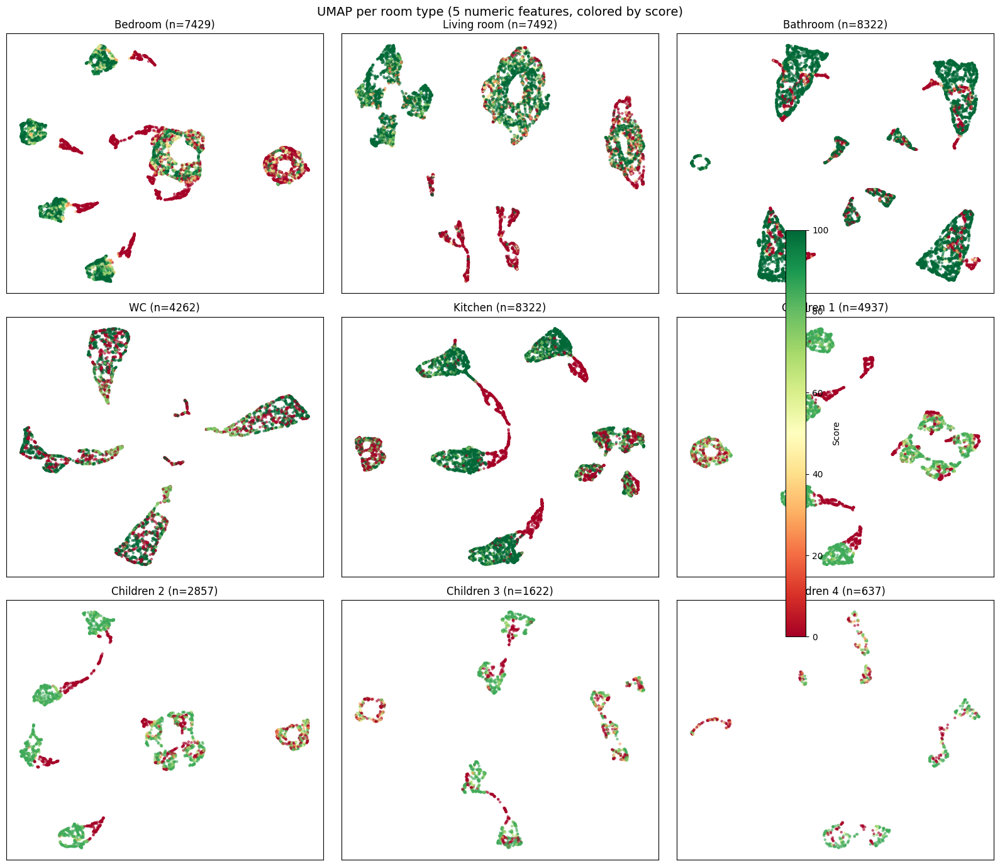

In [4]:
# UMAP 3: Per room type (5 numeric features)
fig, axes = plt.subplots(3, 3, figsize=(16, 14))

for ax, rt in zip(axes.flat, ROOM_TYPES):
    mask = np.array([r.room_type == rt for r in all_rooms])
    X_rt = X_num_scaled[mask]
    y_rt = y[mask]

    if len(X_rt) < 20:
        ax.set_title(f"{rt}\n(too few rooms)")
        continue

    reducer_rt = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
    emb_rt = reducer_rt.fit_transform(X_rt)

    sc = ax.scatter(emb_rt[:, 0], emb_rt[:, 1], c=y_rt,
                    cmap="RdYlGn", s=5, alpha=0.5, vmin=0, vmax=100)
    ax.set_title(f"{rt} (n={mask.sum()})")
    ax.set_xticks([])
    ax.set_yticks([])

fig.colorbar(ScalarMappable(norm=Normalize(0, 100), cmap="RdYlGn"),
             ax=axes, shrink=0.6, label="Score")
plt.suptitle("UMAP per room type (5 numeric features, colored by score)", fontsize=14)
plt.tight_layout()
plt.show()